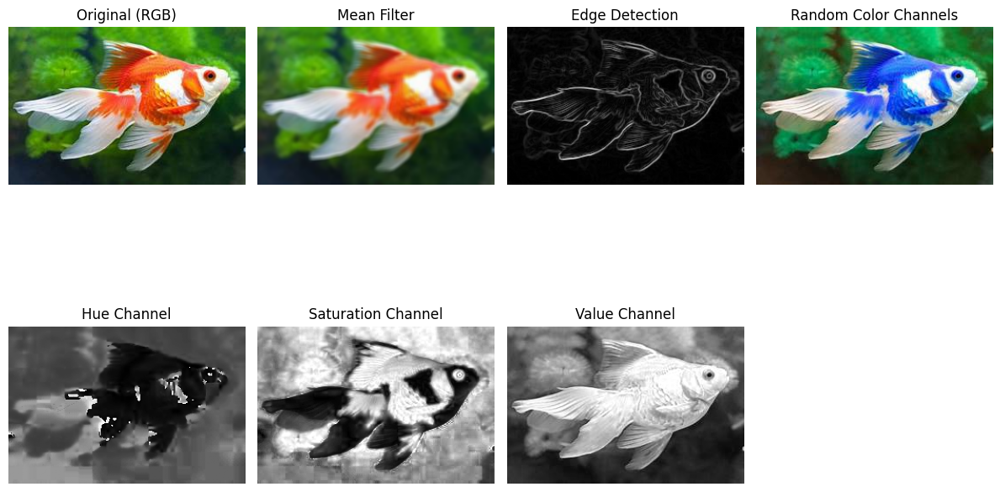

In [1]:
# Câu 1 (2 Điểm): Cho ảnh có tên là a.jpg và thực hiện các yêu cầu:
# - Viết chương trình sử dụng mean filter cho ảnh (0.5 Điểm)
# - Viết chương trình sử dụng filter xác định biên của hình ảnh trên(0.5 Điểm)
# - Viết chương trình đổi màu ảnh từ không gian màu BGR sang một màu ngẫu
# nhiên (RGB) bằng cách thay đổi các kênh màu một cách ngẫu nhiên, sau đó lưu
# hình mới vào file a_random_color.jpg(0.5 Điểm)
# - Chuyển ảnh sang không gian màu HSV và tách riêng kênh Hue, Saturation, Value
# để lưu thành ba ảnh grayscale tương ứng (a_hue.jpg, a_saturation.jpg,
# a_value.jpg) (0.5 Điểm)
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

# Đọc ảnh gốc
img = cv2.imread('a.jpg')
if img is None:
    print("Không tìm thấy ảnh 'a.jpg'")
    exit()

# Chuyển ảnh sang RGB để dùng với matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# ---------- 1. Mean Filter ----------
mean_filtered = cv2.blur(img, (5, 5))  # kernel 5x5
mean_rgb = cv2.cvtColor(mean_filtered, cv2.COLOR_BGR2RGB)
cv2.imwrite('a_mean_filter.jpg', mean_filtered)

# ---------- 2. Lọc biên (Sobel) ----------
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
edges = cv2.magnitude(sobel_x, sobel_y)
edges = np.uint8(cv2.normalize(edges, None, 0, 255, cv2.NORM_MINMAX))
cv2.imwrite('a_edges.jpg', edges)

# ---------- 3. Đổi màu RGB ngẫu nhiên ----------
b, g, r = cv2.split(img)
channels = [r, g, b]
random.shuffle(channels)
random_rgb = cv2.merge(channels)
random_rgb_display = cv2.cvtColor(random_rgb, cv2.COLOR_BGR2RGB)
cv2.imwrite('a_random_color.jpg', random_rgb)

# ---------- 4. Chuyển sang HSV và tách kênh ----------
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

cv2.imwrite('a_hue.jpg', h)
cv2.imwrite('a_saturation.jpg', s)
cv2.imwrite('a_value.jpg', v)

# ---------- HIỂN THỊ KẾT QUẢ ----------
plt.figure(figsize=(12, 8))

plt.subplot(2, 4, 1)
plt.imshow(img_rgb)
plt.title("Original (RGB)")
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(mean_rgb)
plt.title("Mean Filter")
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(edges, cmap='gray')
plt.title("Edge Detection")
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(random_rgb_display)
plt.title("Random Color Channels")
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(h, cmap='gray')
plt.title("Hue Channel")
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(s, cmap='gray')
plt.title("Saturation Channel")
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(v, cmap='gray')
plt.title("Value Channel")
plt.axis('off')

plt.tight_layout()
plt.show()



=== MENU BIẾN ĐỔI ẢNH ===
1. Inverse Transformation
2. Gamma Correction
3. Log Transformation
4. Histogram Equalization
5. Contrast Stretching
6. Adaptive Histogram Equalization
✔ Đã lưu: output/a_Inverse_Transformation.jpg


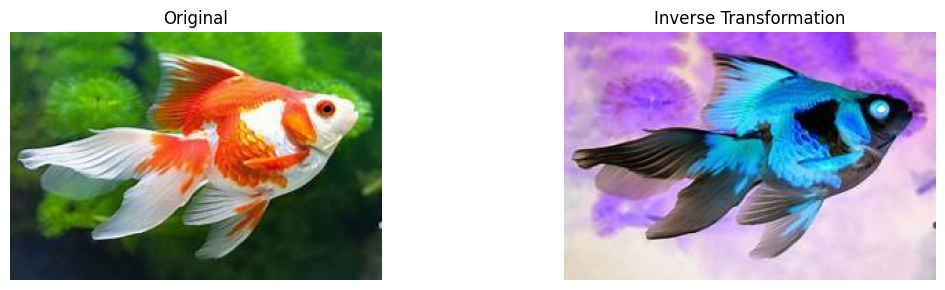

In [3]:
# Câu 2 (4 Điểm): Viết một chương trình Python sử dụng OpenCV để tạo menu động cho
# phép người dùng chọn các phương pháp biến đổi ảnh từ một danh sách mở rộng, áp
# dụng cho nhiều ảnh cùng lúc, và thực hiện các phân tích bổ sung. Các yêu cầu cụ thể:
# 1. Tạo một menu động cho phép người dùng chọn các phương pháp biến đổi ảnh sau:
# - Image inverse transformation(0.5 Điểm)
# - Gamma-Correction (với giá trị gamma ngẫu nhiên từ 0.5 đến 2.0) (0.5 Điểm)
# - Log Transformation (với hệ số nhân ngẫu nhiên từ 1.0 đến 5.0) (0.5 Điểm)
# - Histogram equalization(0.5 Điểm)
# - Contrast Stretching (tùy chỉnh với giá trị min và max ngẫu nhiên từ 0 đến 255)
# (0.5 Điểm)
# - Adaptive Histogram Equalization (sử dụng CLAHE với ô lưới 8x8) (0.5 Điểm)
import cv2
import numpy as np
import os
import random
import matplotlib.pyplot as plt

# ----------------- CÁC HÀM BIẾN ĐỔI ẢNH ------------------

def inverse_transformation(img):
    return 255 - img

def gamma_correction(img):
    gamma = random.uniform(0.5, 2.0)
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in range(256)]).astype("uint8")
    return cv2.LUT(img, table)

def log_transformation(img):
    c = random.uniform(1.0, 5.0)
    img = np.float32(img) + 1.0
    log_img = c * np.log(img)
    return np.uint8(cv2.normalize(log_img, None, 0, 255, cv2.NORM_MINMAX))

def histogram_equalization(img):
    if len(img.shape) == 2:
        return cv2.equalizeHist(img)
    else:
        ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
        ycrcb[:, :, 0] = cv2.equalizeHist(ycrcb[:, :, 0])
        return cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2BGR)

def contrast_stretching(img):
    min_val = random.randint(0, 100)
    max_val = random.randint(155, 255)
    return cv2.normalize(img, None, min_val, max_val, cv2.NORM_MINMAX)

def adaptive_hist_equalization(img):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    if len(img.shape) == 2:
        return clahe.apply(img)
    else:
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        lab[:, :, 0] = clahe.apply(lab[:, :, 0])
        return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# ------------- DANH SÁCH CÁC PHƯƠNG PHÁP ----------------

transformations = {
    '1': ('Inverse Transformation', inverse_transformation),
    '2': ('Gamma Correction', gamma_correction),
    '3': ('Log Transformation', log_transformation),
    '4': ('Histogram Equalization', histogram_equalization),
    '5': ('Contrast Stretching', contrast_stretching),
    '6': ('Adaptive Histogram Equalization', adaptive_hist_equalization),
}

# ------------- HIỂN THỊ MENU ----------------

print("=== MENU BIẾN ĐỔI ẢNH ===")
for key, (name, _) in transformations.items():
    print(f"{key}. {name}")
choices = input("Nhập các lựa chọn (vd: 1,3,6): ").split(',')

# ------------ NHẬP DANH SÁCH ẢNH ----------------

img_paths = input("Nhập đường dẫn các ảnh, cách nhau bởi dấu phẩy (vd: a.jpg,b.jpg): ").split(',')

# Tạo thư mục lưu ảnh đầu ra
os.makedirs("output", exist_ok=True)

# ------------ ÁP DỤNG BIẾN ĐỔI VÀ LƯU ẢNH ----------------

for path in img_paths:
    path = path.strip()
    img = cv2.imread(path)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    filename = os.path.splitext(os.path.basename(path))[0]

    # Hiển thị ảnh gốc
    plt.figure(figsize=(12, 3))
    plt.subplot(1, len(choices)+1, 1)
    plt.imshow(img_rgb)
    plt.title("Original")
    plt.axis('off')

    i = 2  # đánh số subplot
    for choice in choices:
        choice = choice.strip()
        if choice in transformations:
            name, func = transformations[choice]
            result = func(img)
            result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB) if len(result.shape) == 3 else result

            out_name = f"{filename}_{name.replace(' ', '_')}.jpg"
            cv2.imwrite(f"output/{out_name}", result)
            print(f"✔ Đã lưu: output/{out_name}")

            plt.subplot(1, len(choices)+1, i)
            plt.imshow(result_rgb, cmap='gray' if len(result.shape) == 2 else None)
            plt.title(name)
            plt.axis('off')
            i += 1

    plt.tight_layout()
    plt.show()



=== MENU BIẾN ĐỔI ẢNH ===
1. Inverse Transformation
2. Gamma Correction
3. Log Transformation
4. Histogram Equalization
5. Contrast Stretching
6. Adaptive Histogram Equalization
✔ Đã lưu: output/image1_Inverse_Transformation.jpg


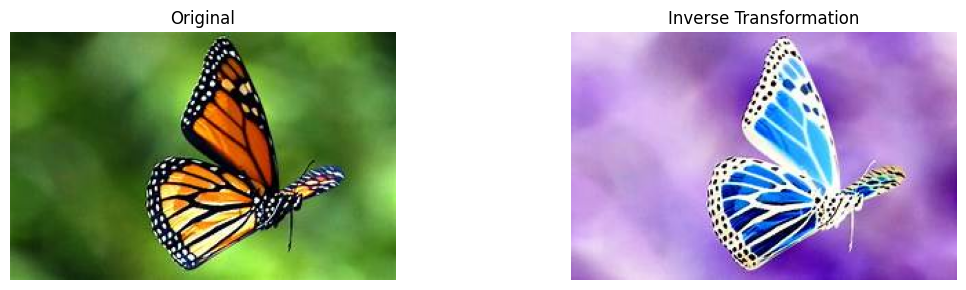

✔ Đã lưu: output/image2_Inverse_Transformation.jpg


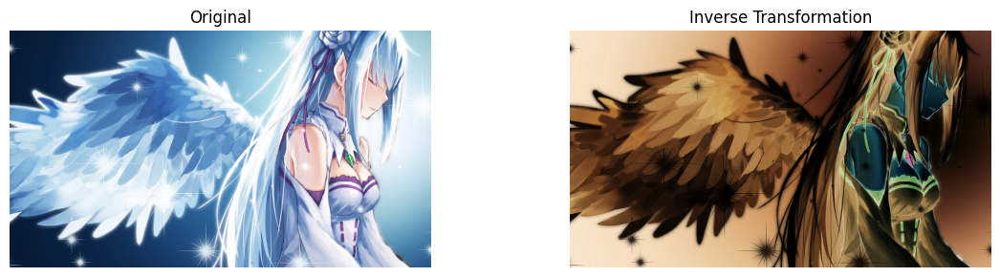

✔ Đã lưu: output/image3_Inverse_Transformation.jpg


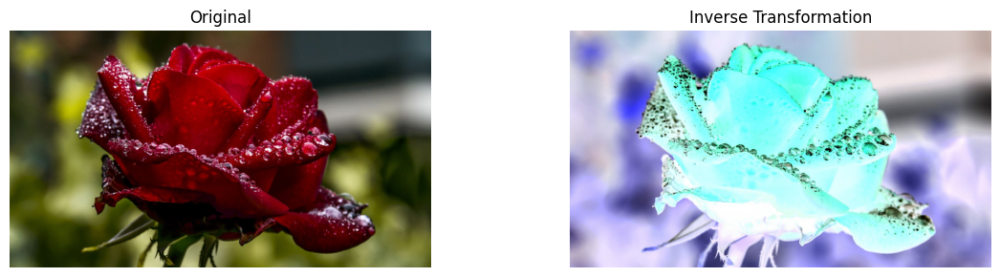

In [7]:
#2. Chương trình phải xử lý đồng thời ba ảnh đầu vào có tên image1.jpg, image2.jpg, và
# image3.jpg (0.5 Điểm)
import cv2
import numpy as np
import os
import random
import matplotlib.pyplot as plt

# ----------------- CÁC HÀM BIẾN ĐỔI ẢNH ------------------

def inverse_transformation(img):
    return 255 - img

def gamma_correction(img):
    gamma = random.uniform(0.5, 2.0)
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in range(256)]).astype("uint8")
    return cv2.LUT(img, table)

def log_transformation(img):
    c = random.uniform(1.0, 5.0)
    img = np.float32(img) + 1.0
    log_img = c * np.log(img)
    return np.uint8(cv2.normalize(log_img, None, 0, 255, cv2.NORM_MINMAX))

def histogram_equalization(img):
    if len(img.shape) == 2:
        return cv2.equalizeHist(img)
    else:
        ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
        ycrcb[:, :, 0] = cv2.equalizeHist(ycrcb[:, :, 0])
        return cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2BGR)

def contrast_stretching(img):
    min_val = random.randint(0, 100)
    max_val = random.randint(155, 255)
    return cv2.normalize(img, None, min_val, max_val, cv2.NORM_MINMAX)

def adaptive_hist_equalization(img):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    if len(img.shape) == 2:
        return clahe.apply(img)
    else:
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        lab[:, :, 0] = clahe.apply(lab[:, :, 0])
        return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# ------------- DANH SÁCH CÁC PHƯƠNG PHÁP ----------------

transformations = {
    '1': ('Inverse Transformation', inverse_transformation),
    '2': ('Gamma Correction', gamma_correction),
    '3': ('Log Transformation', log_transformation),
    '4': ('Histogram Equalization', histogram_equalization),
    '5': ('Contrast Stretching', contrast_stretching),
    '6': ('Adaptive Histogram Equalization', adaptive_hist_equalization),
}

# ------------- HIỂN THỊ MENU ----------------

print("=== MENU BIẾN ĐỔI ẢNH ===")
for key, (name, _) in transformations.items():
    print(f"{key}. {name}")
choices = input("Nhập các lựa chọn (vd: 1,3,6): ").split(',')

# ------------ XỬ LÝ 3 ẢNH CỐ ĐỊNH ----------------

img_paths = ['image1.jpg', 'image2.jpg', 'image3.jpg']
os.makedirs("output", exist_ok=True)

for path in img_paths:
    img = cv2.imread(path)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    filename = os.path.splitext(os.path.basename(path))[0]

    plt.figure(figsize=(12, 3))
    plt.subplot(1, len(choices)+1, 1)
    plt.imshow(img_rgb)
    plt.title("Original")
    plt.axis('off')

    i = 2
    for choice in choices:
        choice = choice.strip()
        if choice in transformations:
            name, func = transformations[choice]
            result = func(img)
            result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB) if len(result.shape) == 3 else result

            out_name = f"{filename}_{name.replace(' ', '_')}.jpg"
            cv2.imwrite(f"output/{out_name}", result)
            print(f"✔ Đã lưu: output/{out_name}")

            plt.subplot(1, len(choices)+1, i)
            plt.imshow(result_rgb, cmap='gray' if len(result.shape) == 2 else None)
            plt.title(name)
            plt.axis('off')
            i += 1

    plt.tight_layout()
    plt.show()




Chọn phím:
I: Inverse, G: Gamma, L: Log, H: HistEq, C: Contrast, A: CLAHE, Q: Thoát
 Đang xử lý: Inverse


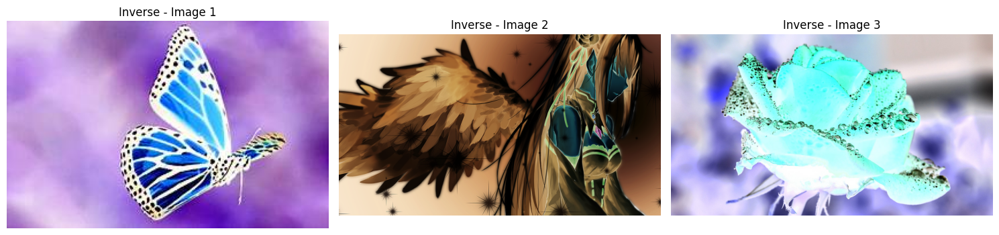


Chọn phím:
I: Inverse, G: Gamma, L: Log, H: HistEq, C: Contrast, A: CLAHE, Q: Thoát
 Đang xử lý: Gamma Correction


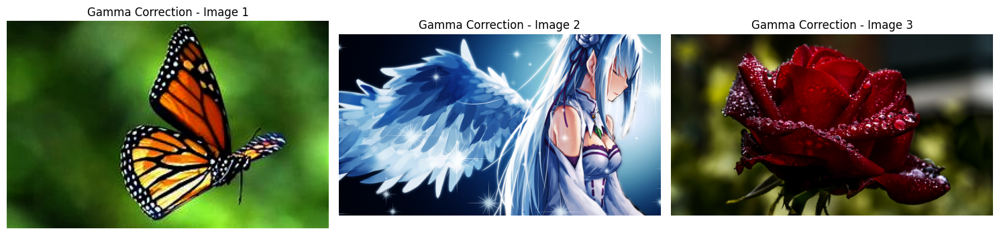


Chọn phím:
I: Inverse, G: Gamma, L: Log, H: HistEq, C: Contrast, A: CLAHE, Q: Thoát
 Đang xử lý: Log Transform


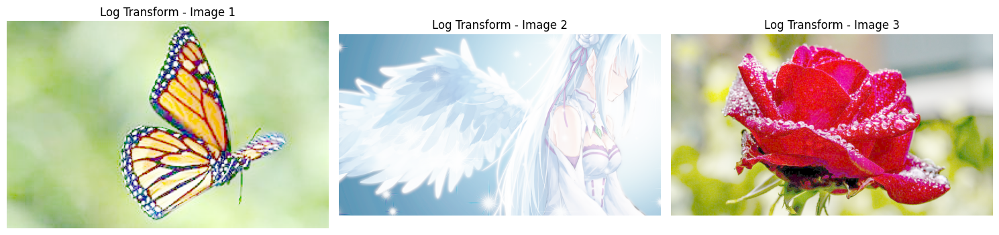


Chọn phím:
I: Inverse, G: Gamma, L: Log, H: HistEq, C: Contrast, A: CLAHE, Q: Thoát
 Đang xử lý: Histogram Equalization


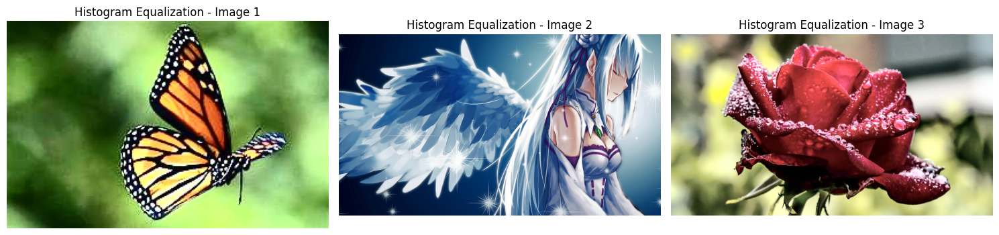


Chọn phím:
I: Inverse, G: Gamma, L: Log, H: HistEq, C: Contrast, A: CLAHE, Q: Thoát
 Đang xử lý: Contrast Stretching


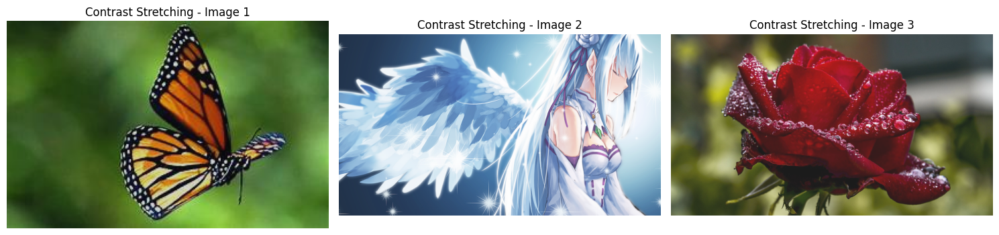


Chọn phím:
I: Inverse, G: Gamma, L: Log, H: HistEq, C: Contrast, A: CLAHE, Q: Thoát
 Đang xử lý: CLAHE


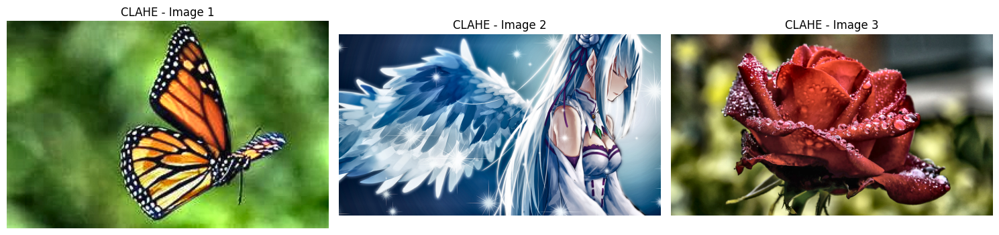


Chọn phím:
I: Inverse, G: Gamma, L: Log, H: HistEq, C: Contrast, A: CLAHE, Q: Thoát


In [ ]:
#  3
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

# Đọc 3 ảnh màu
img_paths = ['image1.jpg', 'image2.jpg', 'image3.jpg']
imgs = [cv2.imread(p) for p in img_paths]
imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in imgs]  # Đổi sang RGB để hiển thị bằng plt

# Hàm biến đổi ảnh
def inverse(img): return 255 - img

def gamma_correction(img):
    gamma = random.uniform(0.5, 2.0)
    table = np.array([((i / 255) ** (1 / gamma)) * 255 for i in range(256)]).astype("uint8")
    return cv2.LUT(img, table)

def log_transform(img):
    c = random.uniform(1.0, 5.0)
    img_float = np.float32(img) + 1
    log_img = c * np.log(img_float)
    return np.uint8(cv2.normalize(log_img, None, 0, 255, cv2.NORM_MINMAX))

def hist_equal(img):
    img_yuv = cv2.cvtColor(cv2.cvtColor(img, cv2.COLOR_RGB2BGR), cv2.COLOR_BGR2YUV)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    return cv2.cvtColor(cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR), cv2.COLOR_BGR2RGB)

def contrast_stretch(img):
    p_min = random.randint(0, 50)
    p_max = random.randint(200, 255)
    return cv2.normalize(img, None, p_min, p_max, cv2.NORM_MINMAX)

def adaptive_hist(img):
    img_lab = cv2.cvtColor(cv2.cvtColor(img, cv2.COLOR_RGB2BGR), cv2.COLOR_BGR2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_lab[:, :, 0] = clahe.apply(img_lab[:, :, 0])
    return cv2.cvtColor(cv2.cvtColor(img_lab, cv2.COLOR_LAB2BGR), cv2.COLOR_BGR2RGB)

# Mapping phím
transformations = {
    'I': ("Inverse", inverse),
    'G': ("Gamma Correction", gamma_correction),
    'L': ("Log Transform", log_transform),
    'H': ("Histogram Equalization", hist_equal),
    'C': ("Contrast Stretching", contrast_stretch),
    'A': ("CLAHE", adaptive_hist)
}

while True:
    print("\nChọn phím:")
    print("I: Inverse, G: Gamma, L: Log, H: HistEq, C: Contrast, A: CLAHE, Q: Thoát")
    key = input("Nhấn phím: ").upper()

    if key == 'Q':
        break
    elif key in transformations:
        title, func = transformations[key]
        print(f" Đang xử lý: {title}")
        processed_imgs = [func(img.copy()) for img in imgs]

        # Hiển thị kết quả bằng matplotlib
        plt.figure(figsize=(15, 5))
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.imshow(processed_imgs[i])
            plt.title(f"{title} - Image {i+1}")
            plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(" Phím không hợp lệ!")


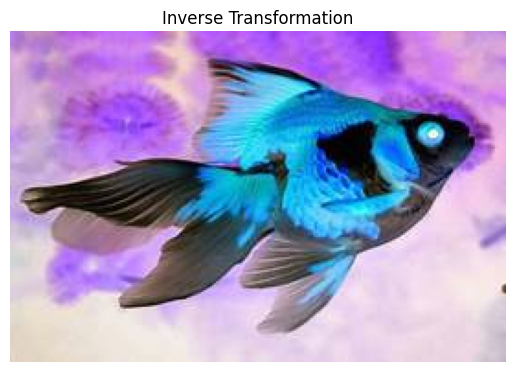

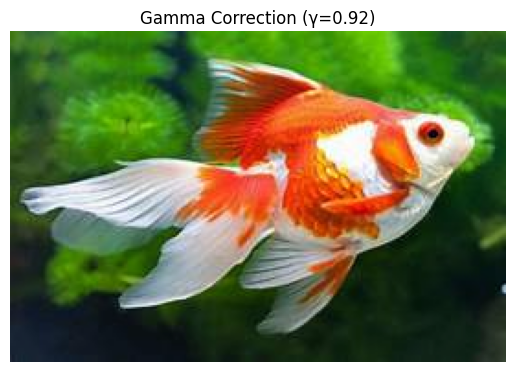

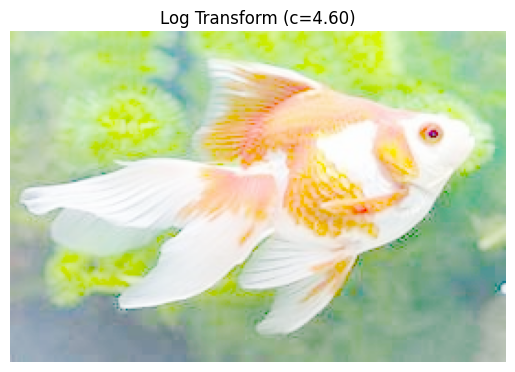

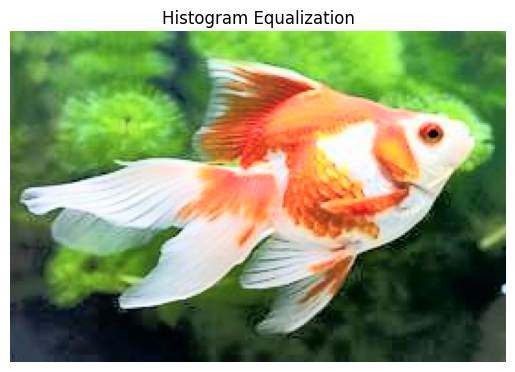

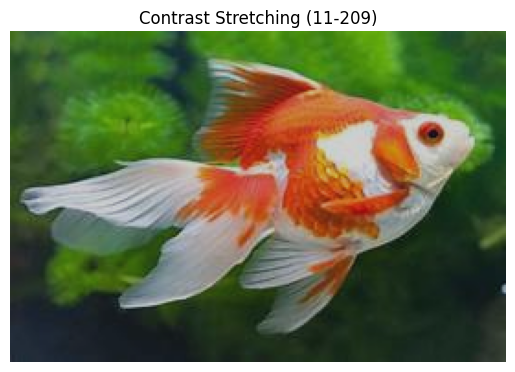

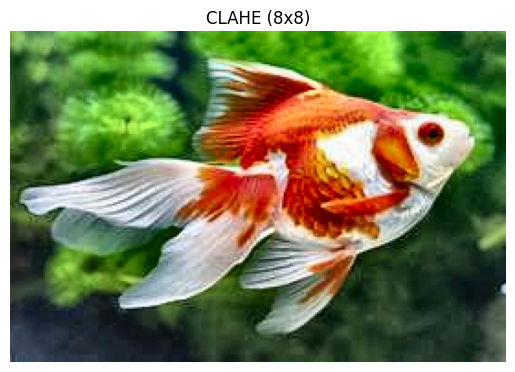

In [ ]:
# 4 
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

# Đọc ảnh và chuyển sang RGB
img = cv2.imread('a.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def show_and_save(title, img, method):
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()
    out_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    cv2.imwrite(f'output_{method}_1.jpg', out_bgr)

# 1. Inverse
inverse_img = 255 - img_rgb
show_and_save('Inverse Transformation', inverse_img, 'inverse')

# 2. Gamma Correction
gamma = random.uniform(0.5, 2.0)
table = np.array([((i / 255.0) ** (1 / gamma)) * 255 for i in range(256)]).astype("uint8")
gamma_img = cv2.LUT(img_rgb, table)
show_and_save(f'Gamma Correction (γ={gamma:.2f})', gamma_img, 'gamma')

# 3. Log Transformation
c = random.uniform(1.0, 5.0)
img_float = np.float32(img_rgb) + 1
log_img = c * np.log(img_float)
log_img = np.uint8(cv2.normalize(log_img, None, 0, 255, cv2.NORM_MINMAX))
show_and_save(f'Log Transform (c={c:.2f})', log_img, 'log')

# 4. Histogram Equalization
img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
hist_eq_img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
show_and_save('Histogram Equalization', hist_eq_img, 'histeq')

# 5. Contrast Stretching
p_min = random.randint(0, 50)
p_max = random.randint(200, 255)
contrast_img = cv2.normalize(img_rgb, None, p_min, p_max, cv2.NORM_MINMAX)
show_and_save(f'Contrast Stretching ({p_min}-{p_max})', contrast_img, 'contrast')

# 6. Adaptive Histogram Equalization (CLAHE)
img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
img_lab[:, :, 0] = clahe.apply(img_lab[:, :, 0])
clahe_img = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)
show_and_save('CLAHE (8x8)', clahe_img, 'clahe')


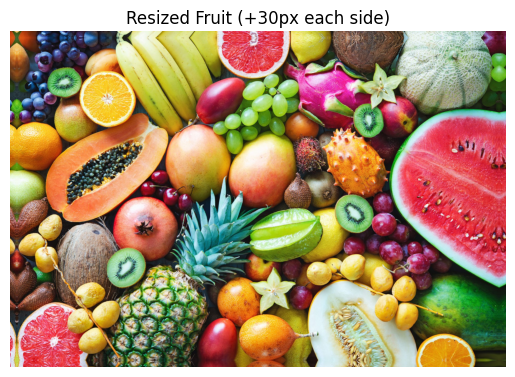

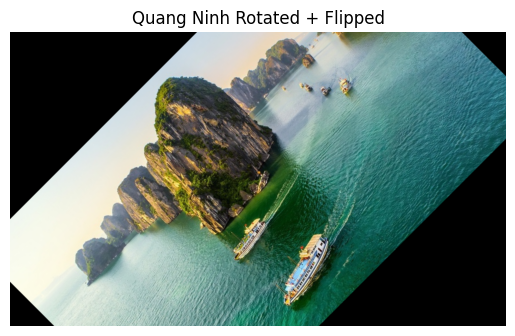

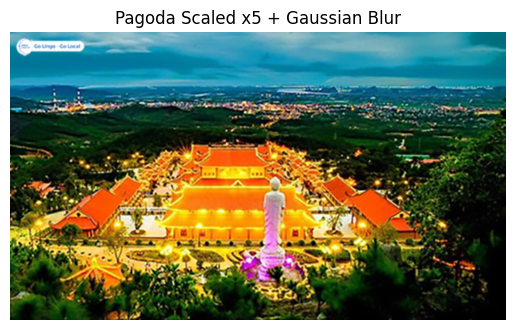

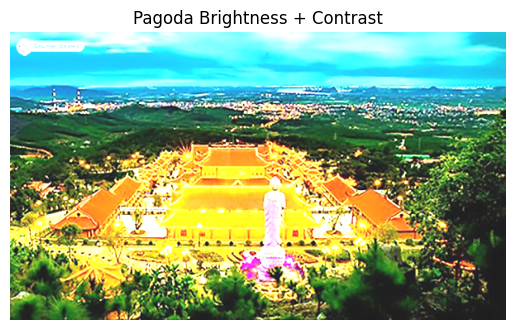

In [12]:
# Câu 3 (4 Điểm): Viết một chương trình Python sử dụng OpenCV để xử lý ba ảnh:
# colorful-ripe-tropical-fruits.jpg, quang-ninh.jpg, và pagoda.jpg với các phương pháp
# biến đổi và tiền xử lý nâng cao.
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_img(img, title, is_rgb=False):
    if is_rgb:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img, cmap='gray' if len(img.shape)==2 else None)
    plt.title(title)
    plt.axis('off')
    plt.show()

# 1. Tăng kích thước ảnh fruits thêm 30 pixel mỗi chiều
img_fruit = cv2.imread('colorful-ripe-tropical-fruits.jpg')
resized_fruit = cv2.copyMakeBorder(img_fruit, 30, 30, 30, 30, cv2.BORDER_REFLECT)
cv2.imwrite('output_fruit_resize.jpg', resized_fruit)
show_img(resized_fruit, 'Resized Fruit (+30px each side)', is_rgb=True)

# 2. Xoay ảnh quang-ninh 45 độ chiều kim đồng hồ và lật ngang
img_quangninh = cv2.imread('quang_ninh.jpg')
(h_q, w_q) = img_quangninh.shape[:2]
center = (w_q // 2, h_q // 2)
M = cv2.getRotationMatrix2D(center, -45, 1.0)
rotated = cv2.warpAffine(img_quangninh, M, (w_q, h_q))
flipped = cv2.flip(rotated, 1)
cv2.imwrite('output_quangninh_rotated_flipped.jpg', flipped)
show_img(flipped, 'Quang Ninh Rotated + Flipped', is_rgb=True)

# 3. Tăng kích thước ảnh pagoda 5 lần và làm mờ Gaussian kernel 7x7
img_pagoda = cv2.imread('pagoda.jpg')
scaled_pagoda = cv2.resize(img_pagoda, None, fx=5.0, fy=5.0, interpolation=cv2.INTER_LINEAR)
blurred_pagoda = cv2.GaussianBlur(scaled_pagoda, (7, 7), 0)
cv2.imwrite('output_pagoda_scaled_blurred.jpg', blurred_pagoda)
show_img(blurred_pagoda, 'Pagoda Scaled x5 + Gaussian Blur', is_rgb=True)

# 4. Biến đổi độ sáng và tương phản ảnh pagoda
alpha = 1.5  # contrast: [0.5 - 2.0]
beta = 30    # brightness: [-50 - 50]
adjusted_pagoda = cv2.convertScaleAbs(img_pagoda, alpha=alpha, beta=beta)
cv2.imwrite('output_pagoda_contrast_brightness.jpg', adjusted_pagoda)
show_img(adjusted_pagoda, 'Pagoda Brightness + Contrast', is_rgb=True)
